## Bank Marketing

## 1. Gather data, determine the method of data collection and provenance of the data (1 point)



This final project focuses on utilizing a dataset from the renowned UCI Machine Learning Repository. The specific dataset chosen for this project is the "Bank Marketing" dataset, which provides rich and detailed information related to the direct marketing campaigns conducted by a Portuguese banking institution. These campaigns were carried out via phone calls, targeting clients with the goal of promoting term deposit subscriptions.

The dataset includes various features such as client demographics, socioeconomic factors, and campaign-related details, providing valuable insights into customer behavior and response patterns. Through this project, the aim is to leverage supervised machine learning techniques to develop a classification model. This model will be trained to predict the likelihood of a client subscribing to a term deposit, represented by the target variable 'y'.

The classification task involves exploring different algorithms, evaluating their performance, and identifying the most suitable model for this specific dataset. Performance metrics such as accuracy, precision, recall, and F1-score will be considered to ensure a comprehensive evaluation of the model. This project not only emphasizes the practical application of machine learning concepts but also provides an opportunity to gain deeper insights into real-world data analysis and predictive modeling.


## Dataset Description
1. Title: Bank Marketing

2. Sources
   Created by: Paulo Cortez (Univ. Minho) and Sérgio Moro (ISCTE-IUL) @ 2012
   
3. Past Usage:

  The full dataset was described and analyzed in:

  S. Moro, R. Laureano and P. Cortez. Using Data Mining for Bank Direct Marketing: An Application of the CRISP-DM Methodology. 
  In P. Novais et al. (Eds.), Proceedings of the European Simulation and Modelling Conference - ESM'2011, pp. 117-121, Guimarães, 
  Portugal, October, 2011. EUROSIS.

4. Relevant Information:

   The data is related with direct marketing campaigns of a Portuguese banking institution. 
   The marketing campaigns were based on phone calls. Often, more than one contact to the same client was required, 
   in order to access if the product (bank term deposit) would be (or not) subscribed. 

   There are two datasets: 
      1) bank-full.csv with all examples, ordered by date (from May 2008 to November 2010).
      2) bank.csv with 10% of the examples (4521), randomly selected from bank-full.csv.
   The smallest dataset is provided to test more computationally demanding machine learning algorithms (e.g. SVM).

   The classification goal is to predict if the client will subscribe a term deposit (variable y).

5. Number of Instances: 45211 for bank-full.csv (4521 for bank.csv)

6. Number of Attributes: 16 + output attribute.

7. Attribute information:

   For more information, read [Moro et al., 2011].

   Input variables:
   #### bank client data:
   1 - age (numeric)
   2 - job : type of job (categorical: "admin.","unknown","unemployed","management","housemaid","entrepreneur","student",
                                       "blue-collar","self-employed","retired","technician","services") 
   3 - marital : marital status (categorical: "married","divorced","single"; note: "divorced" means divorced or widowed)
   4 - education (categorical: "unknown","secondary","primary","tertiary")
   5 - default: has credit in default? (binary: "yes","no")
   6 - balance: average yearly balance, in euros (numeric) 
   7 - housing: has housing loan? (binary: "yes","no")
   8 - loan: has personal loan? (binary: "yes","no")
   #### related with the last contact of the current campaign:
   9 - contact: contact communication type (categorical: "unknown","telephone","cellular") 
  10 - day: last contact day of the month (numeric)
  11 - month: last contact month of year (categorical: "jan", "feb", "mar", ..., "nov", "dec")
  12 - duration: last contact duration, in seconds (numeric)
   #### other attributes:
  13 - campaign: number of contacts performed during this campaign and for this client (numeric, includes last contact)
  14 - pdays: number of days that passed by after the client was last contacted from a previous campaign (numeric, -1 means client was not previously contacted)
  15 - previous: number of contacts performed before this campaign and for this client (numeric)
  16 - poutcome: outcome of the previous marketing campaign (categorical: "unknown","other","failure","success")

  Output variable (desired target):
  17 - y - has the client subscribed a term deposit? (binary: "yes","no")

8. Missing Attribute Values: None

9. Reference:
https://archive.ics.uci.edu/dataset/222/bank+marketing


In [1]:
from ucimlrepo import fetch_ucirepo
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
from utils import *
from typing import List
from statistics import median
from math import isnan
from itertools import filterfalse
from scipy.stats import chi2_contingency, ttest_ind, spearmanr, pointbiserialr
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
import xgboost as xgb
from xgboost import plot_importance,XGBClassifier
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.compose import ColumnTransformer
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score
import optuna


warnings.filterwarnings('ignore')
pd.set_option('display.max_columns',None)
pd.set_option('display.max_rows',None)

In [2]:
number_of_rows = 1000
number_of_columns = 10
bank_marketing_id = 222 #'https://archive.ics.uci.edu/dataset/222/bank+marketing'

## 2.  Identify a Supervised Machine Learning Problem (5 points)

#### 2.2 Functions need to show statistics:

In [3]:
def helper_cat_cat(df: pd.DataFrame,cat1:str, cat2:str):
    contingency_table = pd.crosstab(df[cat1], df[cat2])
    chi2, p, _, _ = chi2_contingency(contingency_table)
    print(f"Chi-square Test between {cat1} and {cat2}: p-value = {p}")
    sns.heatmap(contingency_table, annot=True, fmt="d", cmap="Blues")
    plt.title(f"Contingency Table: {cat1} vs {cat2}")
    plt.show()

def helper_cat_num(df: pd.DataFrame,cat:str, num:str):
    sns.boxplot(x=cat, y=num, data=df)
    plt.title(f"Boxplot of {num} by {cat}")
    plt.show()
    for category in df[cat].unique():
        group = df[df[cat] == category][num]
        print(f"{cat}={category}: Mean={group.mean():.2f}, Std={group.std():.2f}")
    print('\n')

def helper_show_result(df: pd.DataFrame):
    for col in df.columns:
        if col == "y":
            continue
        print(f"Analyzing {col} vs Target (y):")
        if col in ['job','marital','education','default','housing','loan','contact','month','poutcome']:
            helper_cat_cat(df,col, "y")
        else:
            helper_cat_num(df,"y", col)

def helper_show_data(data: pd.DataFrame, numeric_columns: List[str]):
    result = pd.DataFrame()
    for col in numeric_columns:
        col_data = data[col]
        val = [
            col,
            col_data.median(),
            col_data.mean(),
            col_data.std(),
            col_data.min(),
            col_data.quantile(0.05),
            col_data.quantile(0.1),
            col_data.quantile(0.15),
            col_data.quantile(0.2),
            col_data.quantile(0.25),
            col_data.quantile(0.5),
            col_data.quantile(0.75),
            col_data.quantile(0.8),
            col_data.quantile(0.85),
            col_data.quantile(0.9),
            col_data.quantile(0.95),
            col_data.quantile(0.99),
            col_data.max()]
        columns = ['Variable','Median','Mean','Std. Deviation','Min. Value','Percentile 5','Percentile 10','Percentile 15','Percentile 20','Percentile 25','Percentile 50','Percentile 75','Percentile 80','Percentile 85','Percentile 90','Percentile 95','Percentile 99','Max. value']
        table = pd.DataFrame([val], columns=columns)
        result = pd.concat([result, table], ignore_index=True)
    return result

def cramers_v_matrix(df: pd.DataFrame, categorical_columns:List[str]):
    n = len(categorical_columns)
    cramers_v = np.zeros((n, n))

    for i, var1 in enumerate(categorical_columns):
        for j, var2 in enumerate(categorical_columns):
            if i == j:
                cramers_v[i, j] = 1.0
            else:
                contingency_table = pd.crosstab(df[var1], df[var2])
                chi2, _, _, _ = chi2_contingency(contingency_table)
                n_samples = contingency_table.sum().sum()
                cramers_v[i, j] = np.sqrt(chi2 / (n_samples * (min(contingency_table.shape) - 1)))

    return pd.DataFrame(cramers_v, index=categorical_columns, columns=categorical_columns)

## 3. Exploratory Data Analysis (EDA) — Inspect, Visualize and Clean the Data (34 points)
#### 3.1 EDA

In [4]:
bank_marketing = fetch_ucirepo(id=bank_marketing_id)
X = bank_marketing.data.features
y = bank_marketing.data.targets

# Display the dataset information
# Display the first few rows of the dataset
print(X.head())
print(bank_marketing.metadata)
print(bank_marketing.data)
print(bank_marketing.variables)


# Display the number of rows and columns in the dataset
df = X.copy()
df['y'] = y
df.sample(5)
df.info()
df.describe()
df.isnull().sum()


   age           job  marital  education default  balance housing loan  \
0   58    management  married   tertiary      no     2143     yes   no   
1   44    technician   single  secondary      no       29     yes   no   
2   33  entrepreneur  married  secondary      no        2     yes  yes   
3   47   blue-collar  married        NaN      no     1506     yes   no   
4   33           NaN   single        NaN      no        1      no   no   

  contact  day_of_week month  duration  campaign  pdays  previous poutcome  
0     NaN            5   may       261         1     -1         0      NaN  
1     NaN            5   may       151         1     -1         0      NaN  
2     NaN            5   may        76         1     -1         0      NaN  
3     NaN            5   may        92         1     -1         0      NaN  
4     NaN            5   may       198         1     -1         0      NaN  
{'uci_id': 222, 'name': 'Bank Marketing', 'repository_url': 'https://archive.ics.uci.edu/data

age                0
job              288
marital            0
education       1857
default            0
balance            0
housing            0
loan               0
contact        13020
day_of_week        0
month              0
duration           0
campaign           0
pdays              0
previous           0
poutcome       36959
y                  0
dtype: int64

In [5]:
print(df.isna().sum()/df.shape[0]*100)

age             0.000000
job             0.637013
marital         0.000000
education       4.107407
default         0.000000
balance         0.000000
housing         0.000000
loan            0.000000
contact        28.798301
day_of_week     0.000000
month           0.000000
duration        0.000000
campaign        0.000000
pdays           0.000000
previous        0.000000
poutcome       81.747805
y               0.000000
dtype: float64


Focusing primarily on categorical variables with a high proportion of null values, like `poutcome` (81.7478%), `contact` (28.7983%), `education` (4.1074%), and `job` (0.6370%). The strategy prioritizes minimizing data loss while maintaining the integrity of the analysis.

### Strategy Breakdown
1. **Categorical Variables (`poutcome`, `contact`, `education`)**:
   - Missing values are replaced with the category `"unknown"`, ensuring that these null entries don't disrupt analysis or classification while maintaining all rows.

2. **Variable `job`**:
   - **Option 1**: Delete rows with missing values. This approach prevents any assumptions about the missing entries but risks losing potentially valuable data.
   - **Option 2**: Replace missing entries with the most common category. The text suggests opting for this strategy since the percentage of null values is minimal (0.63%).

This approach balances pragmatism and precision by treating high-percentage null variables differently than those with negligible missing values.

In [6]:
df['poutcome'] = df['poutcome'].fillna('unknown')
df['contact'] = df['contact'].fillna('unknown')
df['education'] = df['education'].fillna('unknown')
df['job'] = df['job'].fillna(df['job'].mode().values[0])

print(df.isna().sum()/df.shape[0]*100)
duplicate = df[df.duplicated()]
print("Duplicate")
print(duplicate)


age            0.0
job            0.0
marital        0.0
education      0.0
default        0.0
balance        0.0
housing        0.0
loan           0.0
contact        0.0
day_of_week    0.0
month          0.0
duration       0.0
campaign       0.0
pdays          0.0
previous       0.0
poutcome       0.0
y              0.0
dtype: float64
Duplicate
Empty DataFrame
Columns: [age, job, marital, education, default, balance, housing, loan, contact, day_of_week, month, duration, campaign, pdays, previous, poutcome, y]
Index: []


Now that the data is clear, it’s time to inspect and make some changes   to our focus 

               count         mean          std     min    25%    50%     75%  \
age          45211.0    40.936210    10.618762    18.0   33.0   39.0    48.0   
balance      45211.0  1362.272058  3044.765829 -8019.0   72.0  448.0  1428.0   
day_of_week  45211.0    15.806419     8.322476     1.0    8.0   16.0    21.0   
duration     45211.0   258.163080   257.527812     0.0  103.0  180.0   319.0   
campaign     45211.0     2.763841     3.098021     1.0    1.0    2.0     3.0   
pdays        45211.0    40.197828   100.128746    -1.0   -1.0   -1.0    -1.0   
previous     45211.0     0.580323     2.303441     0.0    0.0    0.0     0.0   

                  max  
age              95.0  
balance      102127.0  
day_of_week      31.0  
duration       4918.0  
campaign         63.0  
pdays           871.0  
previous        275.0  


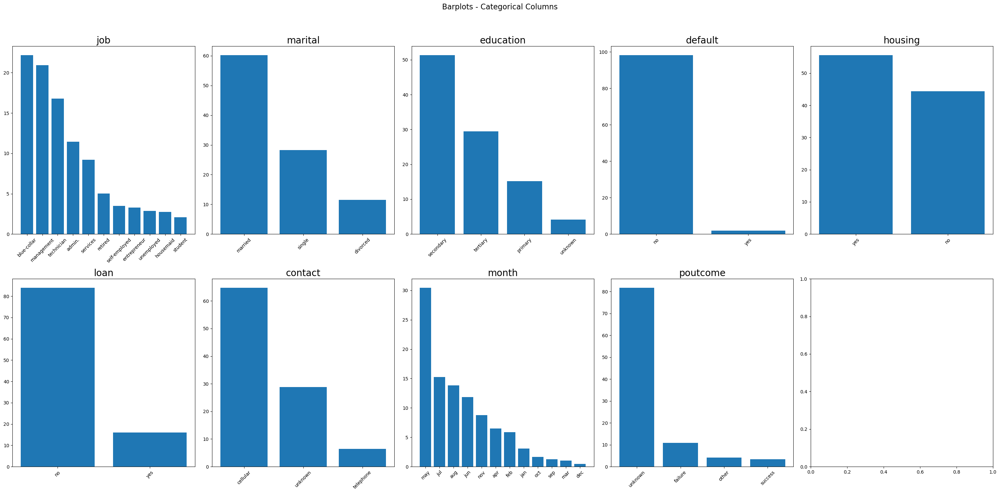

default
no     98.197341
yes     1.802659
Name: proportion, dtype: float64

In [7]:
print(df.describe().T)

# Categorical variables
categorical_columns = ['job','marital','education','default','housing','loan','contact','month','poutcome']
fig, axes = plt.subplots(nrows=2, ncols=5, figsize=(30, 15), sharey=False)
axes = axes.flatten()
for i, column in enumerate(categorical_columns):
    percentage = df[column].value_counts(normalize=True) * 100
    percentage_df = percentage.reset_index()
    percentage_df.columns = [column, 'Percentage']

    axes[i].bar(percentage_df[column], percentage_df['Percentage'])
    axes[i].set_title(column, fontsize=20)
    axes[i].tick_params(axis='x', rotation=45)

fig.suptitle("Barplots - Categorical Columns", fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

df['y'].value_counts(normalize=True)*100

df['default'].value_counts(normalize=True)*100


Just to be sure, I am going to check if there are outliers 

['age', 'balance', 'day_of_week', 'duration', 'campaign', 'pdays', 'previous']


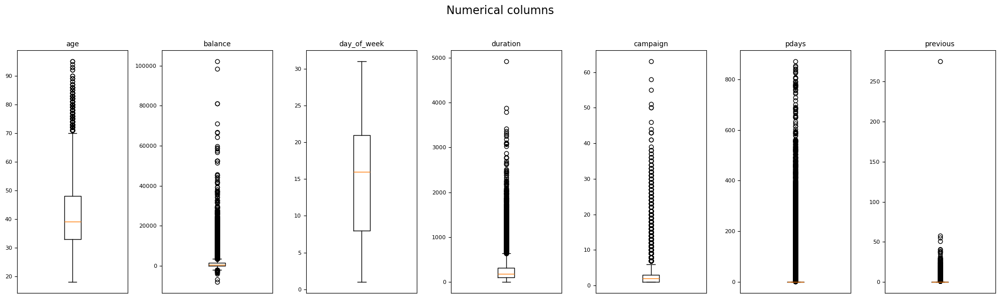

Analyzing age vs Target (y):


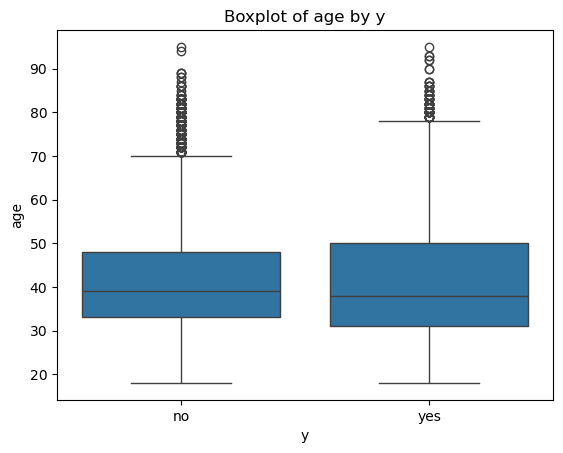

y=no: Mean=40.84, Std=10.17
y=yes: Mean=41.67, Std=13.50


Analyzing job vs Target (y):
Chi-square Test between job and y: p-value = 5.575427995540736e-172


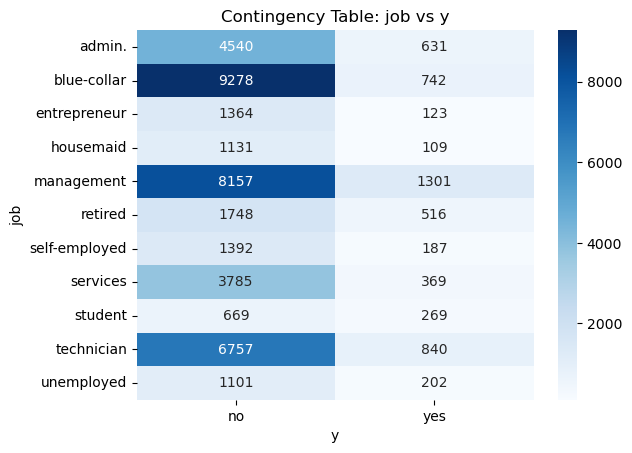

Analyzing marital vs Target (y):
Chi-square Test between marital and y: p-value = 2.1450999986791792e-43


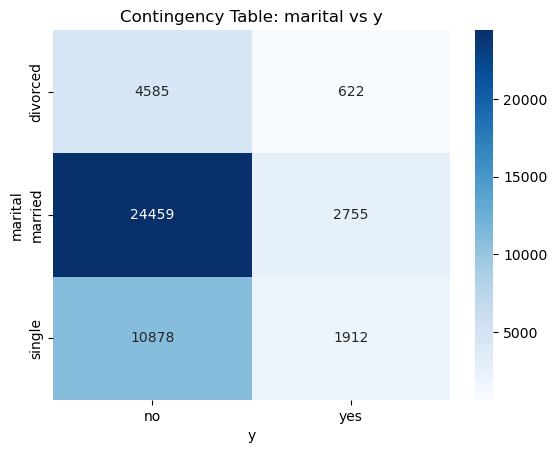

Analyzing education vs Target (y):
Chi-square Test between education and y: p-value = 1.6266562124072994e-51


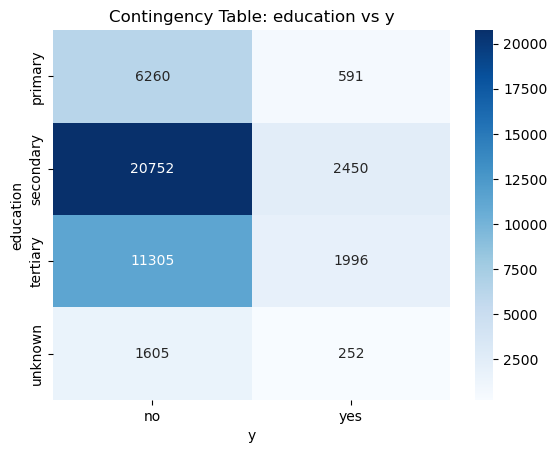

Analyzing default vs Target (y):
Chi-square Test between default and y: p-value = 2.4538606753508344e-06


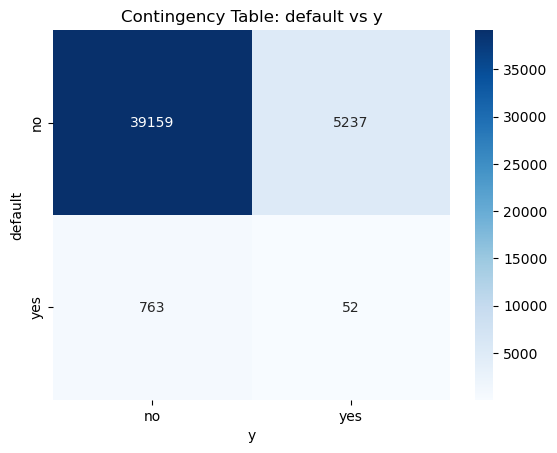

Analyzing balance vs Target (y):


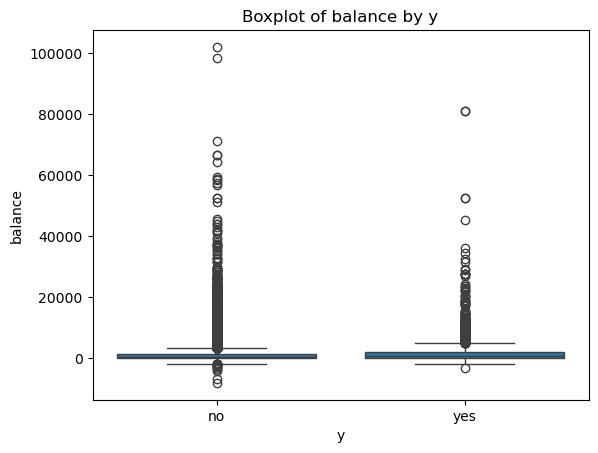

y=no: Mean=1303.71, Std=2974.20
y=yes: Mean=1804.27, Std=3501.10


Analyzing housing vs Target (y):
Chi-square Test between housing and y: p-value = 2.918797605076633e-192


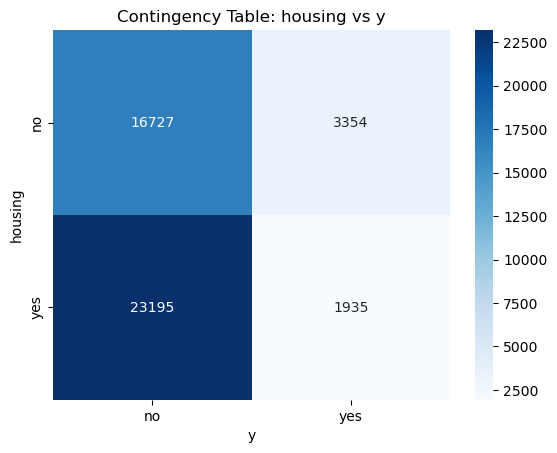

Analyzing loan vs Target (y):
Chi-square Test between loan and y: p-value = 1.665061163492756e-47


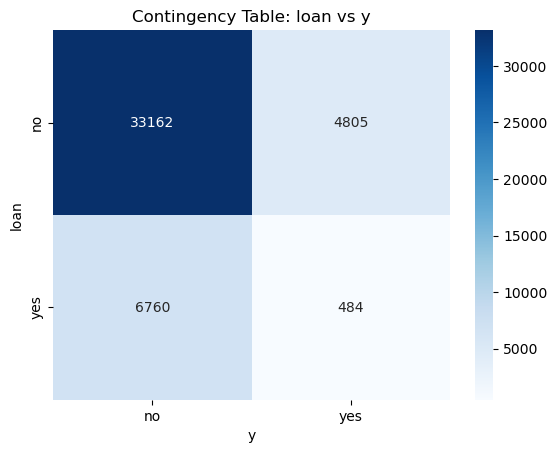

Analyzing contact vs Target (y):
Chi-square Test between contact and y: p-value = 1.251738325340638e-225


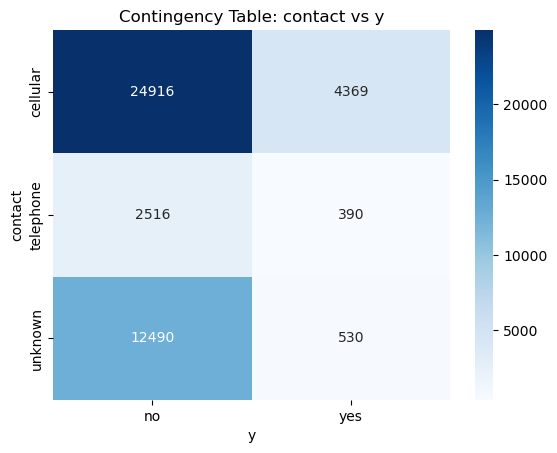

Analyzing day_of_week vs Target (y):


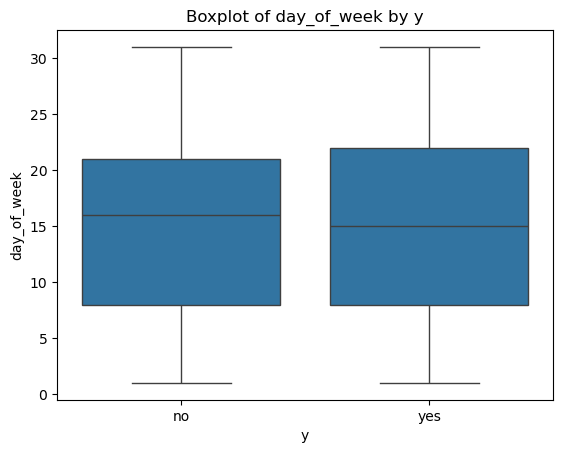

y=no: Mean=15.89, Std=8.29
y=yes: Mean=15.16, Std=8.50


Analyzing month vs Target (y):
Chi-square Test between month and y: p-value = 0.0


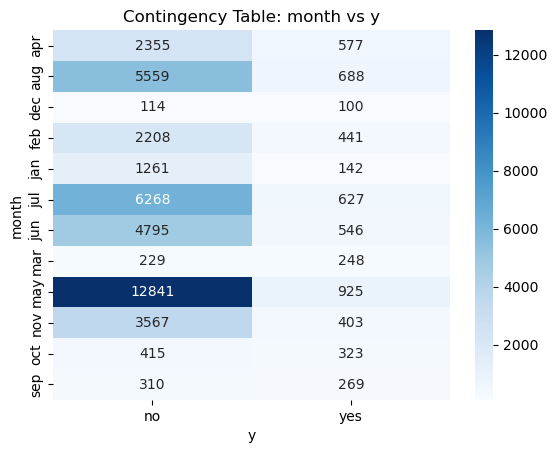

Analyzing duration vs Target (y):


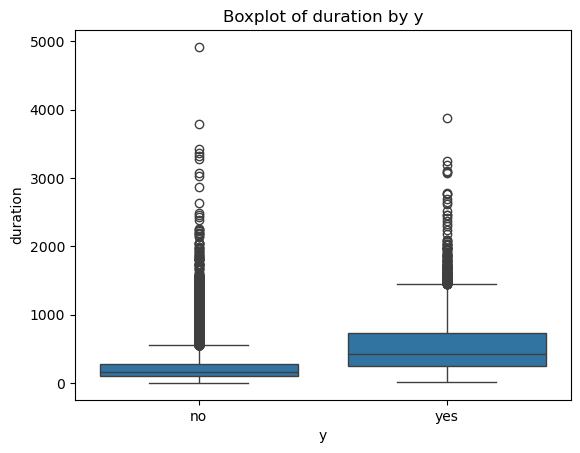

y=no: Mean=221.18, Std=207.38
y=yes: Mean=537.29, Std=392.53


Analyzing campaign vs Target (y):


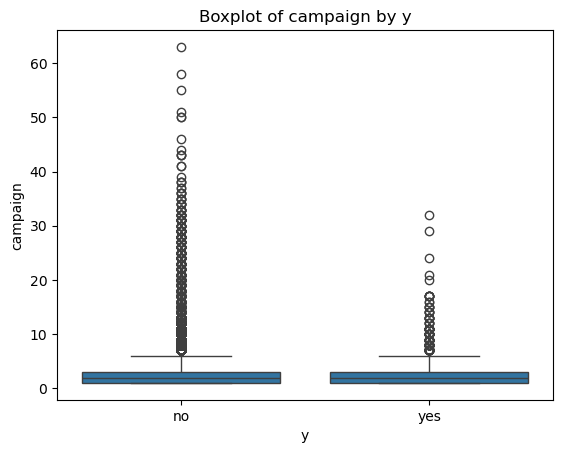

y=no: Mean=2.85, Std=3.21
y=yes: Mean=2.14, Std=1.92


Analyzing pdays vs Target (y):


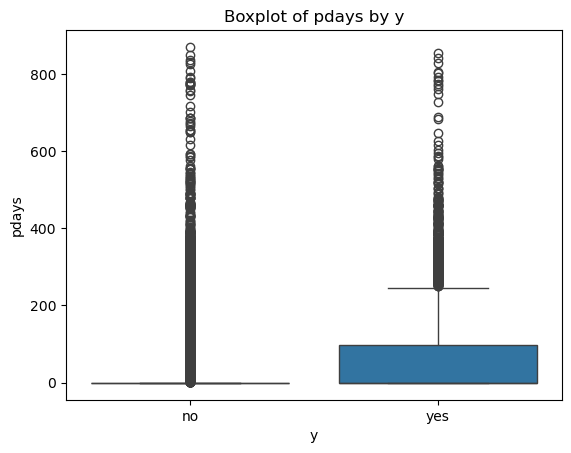

y=no: Mean=36.42, Std=96.76
y=yes: Mean=68.70, Std=118.82


Analyzing previous vs Target (y):


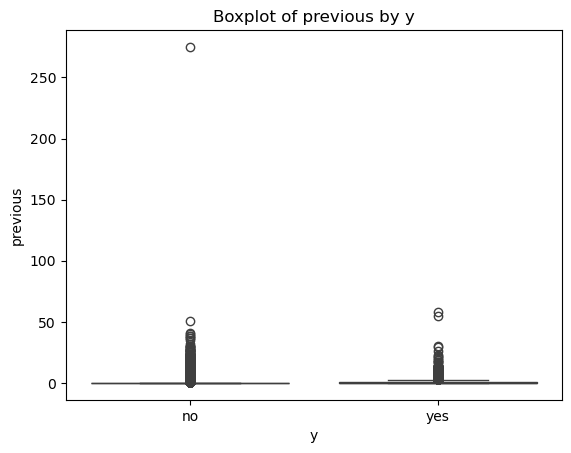

y=no: Mean=0.50, Std=2.26
y=yes: Mean=1.17, Std=2.55


Analyzing poutcome vs Target (y):
Chi-square Test between poutcome and y: p-value = 0.0


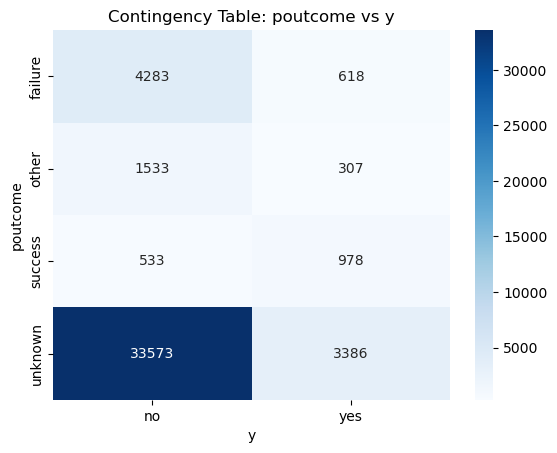

In [8]:
numerical_columns = df.select_dtypes([np.number]).columns.tolist()
print(numerical_columns)
helper_show_data(data=df,numeric_columns=numerical_columns)

fig, axes = plt.subplots(nrows=1, ncols=7, figsize=(20, 6), sharey=False)

for i, column in enumerate(numerical_columns):
    axes[i].boxplot(df[column], vert=True)
    axes[i].set_title(column, fontsize=10)
    axes[i].tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
    axes[i].tick_params(axis='y', labelsize=8)


fig.suptitle("Numerical columns", fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.95])


plt.show()

helper_show_result(df=df)


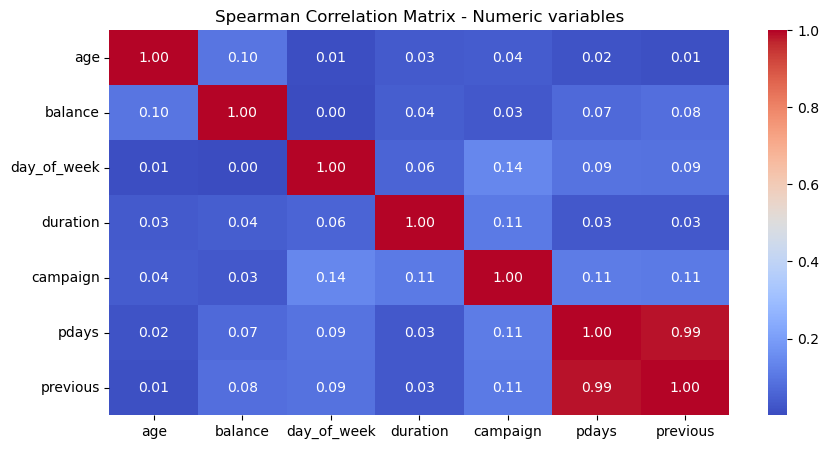

In [9]:
spearman_matrix = df[numerical_columns].corr(method='spearman').abs()
fig = plt.figure(figsize=(10,5))
sns.heatmap(spearman_matrix, annot=True, cmap="coolwarm", fmt=".2f")
plt.title('Spearman Correlation Matrix - Numeric variables')
plt.show()


#### The matrix shows the Spearman rank correlation coefficients between variables. These values range from -1 to 1:
- A coefficient close to **1** means a strong positive correlation (as one variable increases, so does the other).
- A coefficient near **-1** indicates a strong negative correlation (as one variable increases, the other decreases).
- A coefficient close to **0** suggests no linear relationship.

####  The matrix uses a gradient of colors to represent the strength and direction of correlations:
- **Red** represents stronger correlations (positive or negative).
- **Blue** indicates weaker or no correlation.
- The diagonal cells are all red with a value of **1.00** because each variable is perfectly correlated with itself.

####  **Variables in the Matrix**:
   - The variables included are `age`, `balance`, `day_of_week`, `duration`, `campaign`, and `previous`.
   - By analyzing the matrix, you can quickly identify which variables are strongly correlated.

### The final dataset to use in the project:

In [10]:
final_columns = list(set(categorical_columns)) + list(set(numerical_columns)) + ['y']
print(final_columns)
final_dataset = df[final_columns].copy()
final_dataset.to_csv('./Data/final_data.csv',sep='|',index=None)

['default', 'education', 'contact', 'marital', 'poutcome', 'housing', 'loan', 'month', 'job', 'balance', 'day_of_week', 'campaign', 'age', 'pdays', 'previous', 'duration', 'y']


## 4. Perform Analysis Using Supervised Machine Learning Models of your Choice, Present Discussion and Conclusions (65 points)


#### 4.1. **Model Selection**: Evaluate various algorithms for binary classification, such as Decision Trees, Random Forest, and Gradient Boosted Machines.


In [11]:
final_dataset.sample()

categorical_columns = ['job','marital','education','default','housing','loan','contact','month','poutcome']
numerical_columns = ['day_of_week','age','balance','campaign','duration']
target = 'y'

#TESTING
#X = final_dataset.drop(columns=[target])
#y = final_dataset[target]

# Split the dataset into training and test sets
X, y = final_dataset.drop(columns=['y']), final_dataset['y'].map({'yes':1, 'no':0})
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)


preprocessor = ColumnTransformer(
    transformers=[
        ("num", StandardScaler(), numerical_columns),
        ("cat", OneHotEncoder(drop="first", sparse_output=False), categorical_columns)
    ]
)

models = {
    "Decision Tree": DecisionTreeClassifier(random_state=42),
    "Random Forest": RandomForestClassifier(random_state=42, n_jobs=-1),
    "XGBoost": xgb.XGBClassifier(use_label_encoder=False, eval_metric="logloss", verbose=0,random_state=42),
    "AdaBoost": AdaBoostClassifier(random_state=42)
}


def evaluate_model(name, model):
    X_preprocessed_train = preprocessor.fit_transform(X_train)
    model.fit(X_preprocessed_train, y_train)
    X_preprocessed_test = preprocessor.transform(X_test)
    y_pred = model.predict(X_preprocessed_test)
    y_proba = model.predict_proba(X_preprocessed_test)[:, 1]
    print(f"--- {name} ---")
    acc = accuracy_score(y_test, y_pred)
    print(f"Accuracy: {acc:.4f}")
    prec_score = precision_score(y_test, y_pred)
    print(f"Precision: {prec_score:.4f}")
    rec_score = recall_score(y_test, y_pred)
    print(f"Recall: {rec_score:.4f}")
    f1score = f1_score(y_test, y_pred)
    print(f"F1-Score: {f1score:.4f}")
    roc = roc_auc_score(y_test, y_proba)
    print(f"AUC-ROC: {roc:.4f}")
    print()
    return {name : {'Accuracy':acc, 'Precision':prec_score, 'Recall':rec_score, 'F1-Score':f1score, 'AUC-ROC':roc}}


results = {}
for name, model in models.items():
    results.update(evaluate_model(name, model))


--- Decision Tree ---
Accuracy: 0.8794
Precision: 0.4847
Recall: 0.4943
F1-Score: 0.4895
AUC-ROC: 0.7123

--- Random Forest ---
Accuracy: 0.9048
Precision: 0.6561
Recall: 0.3913
F1-Score: 0.4902
AUC-ROC: 0.9262

--- XGBoost ---
Accuracy: 0.9088
Precision: 0.6379
Recall: 0.5095
F1-Score: 0.5665
AUC-ROC: 0.9293

--- AdaBoost ---
Accuracy: 0.8983
Precision: 0.6078
Recall: 0.3677
F1-Score: 0.4582
AUC-ROC: 0.9072



#### 4.2. **Baseline Model**: Begin with a simple Decision Tree to establish baseline performance for comparison.

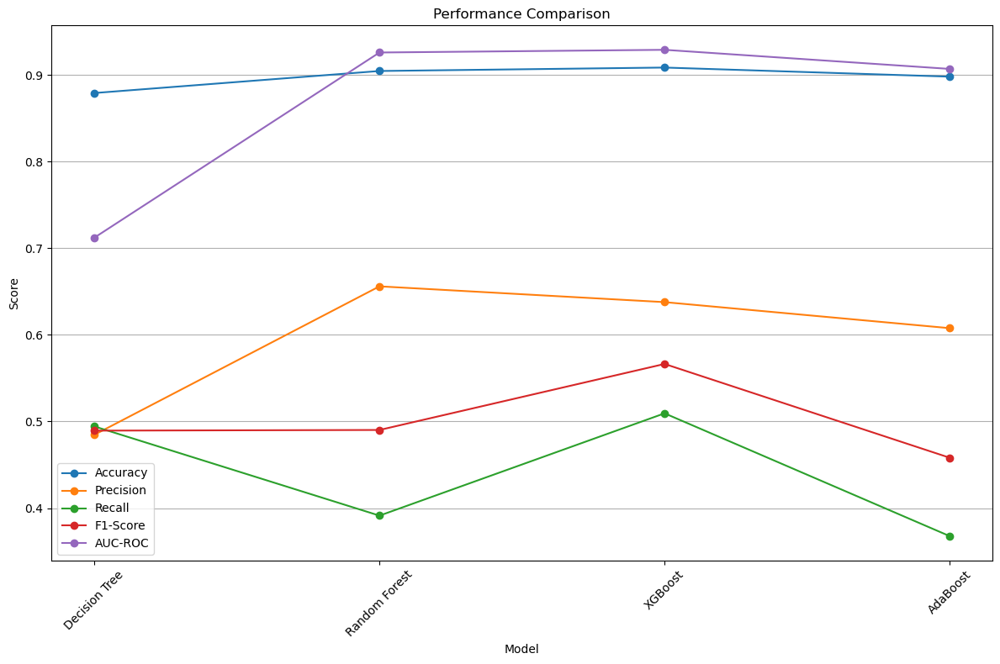

In [12]:
results_df = pd.DataFrame(results).T
metrics = results_df.columns
x = range(results_df.shape[0])

plt.figure(figsize=(12, 8))
for metric in metrics:
    plt.plot(x, results_df[metric], marker='o', label=metric)


plt.xticks(x, results.keys(), rotation=45)
plt.xlabel("Model")
plt.ylabel("Score")
plt.title("Performance Comparison")
plt.legend()
plt.grid(axis="y")
plt.tight_layout()
plt.show()

#### 4.3. **Feature Importance Analysis**: Assess the influence of individual features on predictions.

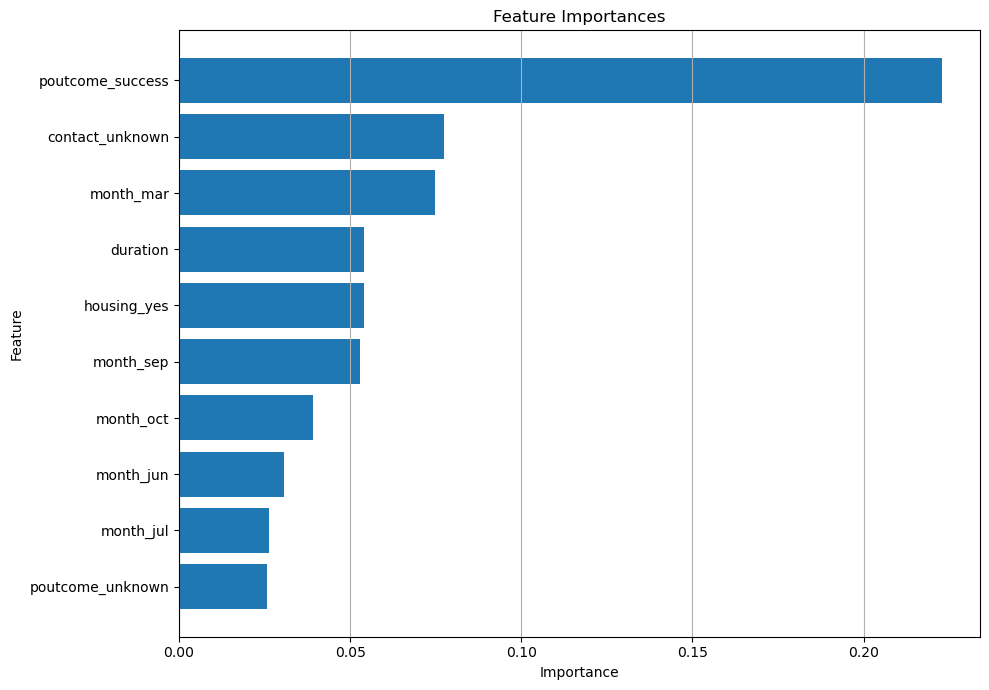

In [13]:
X_preprocessed = preprocessor.fit_transform(X_train)
feature_names = (
    numerical_columns +
    preprocessor.named_transformers_["cat"].get_feature_names_out(categorical_columns).tolist()
)

importance_df = pd.DataFrame({
    "Feature": feature_names,
    "Importance": models['XGBoost'].feature_importances_
}).sort_values(by="Importance", ascending=False)

plt.figure(figsize=(10, 7))
plt.barh(importance_df["Feature"][:10], importance_df["Importance"][:10])
plt.title("Feature Importances")
plt.xlabel("Importance")
plt.ylabel("Feature")
plt.gca().invert_yaxis()
plt.grid(axis="x")
plt.tight_layout()
plt.show()

#### 4.4. **Hyperparameter Tuning**: Use grid or randomized search to optimize performance with cross-validation.

In [15]:

def objective(trial):
    # Hyperparameter search space
    param = {
        "verbosity": 0,
        "n_estimators": trial.suggest_int("n_estimators", 50, 200, step=50),
        "max_depth": trial.suggest_int("max_depth", 3, 10),
        "learning_rate": trial.suggest_loguniform("learning_rate", 1e-5, 0.1),
        "subsample": trial.suggest_uniform("subsample", 0.7, 1.0),
        "colsample_bytree": trial.suggest_uniform("colsample_bytree", 0.7, 1.0),
        "eval_metric": "logloss",
        "use_label_encoder": False
    }

    model = XGBClassifier(**param)
    X_prep_train = preprocessor.fit_transform(X_train)
    model.fit(X_prep_train, y_train)
    X_prep_test = preprocessor.fit_transform(X_test)
    y_pred = model.predict(X_prep_test)
    y_proba = model.predict_proba(X_prep_test)[:, 1]
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)
    auc_roc = roc_auc_score(y_test, y_proba)

    return f1


study = optuna.create_study(direction="maximize")
study.optimize(objective, n_trials=100)

print("Best hyperparameters : ", study.best_params)

# Train the model with the best parameters
best_params = study.best_params
best_xgb_model = XGBClassifier(**best_params)
X_prep_train = preprocessor.fit_transform(X_train)
best_xgb_model.fit(X_prep_train, y_train)


X_prep_test = preprocessor.fit_transform(X_test)
y_pred = best_xgb_model.predict(X_prep_test)
y_proba = best_xgb_model.predict_proba(X_prep_test)[:, 1]

print("\nEvaluation Metrics:")
print(f"Accuracy: {accuracy_score(y_test, y_pred):.4f}")
print(f"Precision: {precision_score(y_test, y_pred):.4f}")
print(f"Recall: {recall_score(y_test, y_pred):.4f}")
print(f"F1-Score: {f1_score(y_test, y_pred):.4f}")
print(f"AUC-ROC: {roc_auc_score(y_test, y_proba):.4f}")

[I 2025-04-27 11:03:21,634] A new study created in memory with name: no-name-06cf2f79-d0a3-4b27-9307-46c05551a250
[I 2025-04-27 11:03:22,144] Trial 0 finished with value: 0.0 and parameters: {'n_estimators': 200, 'max_depth': 10, 'learning_rate': 5.3455979782194215e-05, 'subsample': 0.8973812957066234, 'colsample_bytree': 0.7462360235770049}. Best is trial 0 with value: 0.0.
[I 2025-04-27 11:03:22,310] Trial 1 finished with value: 0.0 and parameters: {'n_estimators': 50, 'max_depth': 3, 'learning_rate': 0.00045248669199924083, 'subsample': 0.8281811044916074, 'colsample_bytree': 0.7538903139424736}. Best is trial 0 with value: 0.0.
[I 2025-04-27 11:03:22,642] Trial 2 finished with value: 0.0 and parameters: {'n_estimators': 100, 'max_depth': 10, 'learning_rate': 4.3996825510423464e-05, 'subsample': 0.8322756602935828, 'colsample_bytree': 0.7559428109440884}. Best is trial 0 with value: 0.0.
[I 2025-04-27 11:03:22,874] Trial 3 finished with value: 0.0 and parameters: {'n_estimators': 15

Best hyperparameters :  {'n_estimators': 200, 'max_depth': 6, 'learning_rate': 0.07516003906569034, 'subsample': 0.8709297983172636, 'colsample_bytree': 0.9011342278899719}

Evaluation Metrics:
Accuracy: 0.9089
Precision: 0.6396
Recall: 0.5066
F1-Score: 0.5654
AUC-ROC: 0.9303


#### 4.5. **Performance Evaluation**: Measure accuracy, precision, recall, F1-score, AUC-ROC, and confusion matrices.

Let's delve deeper into what each metric signifies and how the values reflect the model's performance:

##### 4.5.1. **Accuracy (0.9066)**:
   - Accuracy measures the proportion of correctly classified instances out of all instances in the dataset. Here, the model achieves approximately **90.66% accuracy**, meaning it performs well overall. However, it is important to note that accuracy alone might not be sufficient if the dataset is imbalanced (e.g., one class significantly outweighs the other).

##### 4.5.2. **Precision (0.6226)**:
   - Precision indicates the proportion of true positive predictions (correctly identified positive cases) out of all positive predictions made by the model. At **62.26%**, the model demonstrates reasonable precision, suggesting it’s moderately reliable when it predicts the positive class. Higher precision is desirable when the cost of a false positive is high.

##### 4.5.3. **Recall (0.5113)**:
   - Recall (also known as sensitivity) represents the proportion of actual positive cases that the model correctly identifies. Here, the recall is **51.13%**, indicating that the model misses over half of the actual positive instances. This suggests room for improvement, especially in situations where capturing as many positive cases as possible is critical.

##### 4.5.4. **F1-Score (0.5615)**:
   - The F1-Score is the harmonic mean of precision and recall, offering a balanced metric when there is a tradeoff between the two. With an F1-Score of **56.15%**, the model shows a balance, albeit not optimal, between identifying positives (recall) and correctly classifying positives (precision).

#### 4.5.5. **AUC-ROC (0.9290)**:
   - The Area Under the Receiver Operating Characteristic Curve (AUC-ROC) measures the model's ability to distinguish between positive and negative classes at varying classification thresholds. With an AUC-ROC of **92.90%**, the model demonstrates a strong capability to separate the classes effectively, even when precision and recall are less than ideal.


#### 4.6. **Insights and Recommendations**: Leverage model results to provide actionable marketing strategies for targeting potential clients.

The model performs well in terms of accuracy and AUC-ROC, but there’s room to improve precision, recall, and F1-Score. Enhancing these metrics may require:
- **Feature Engineering**: Identifying and incorporating additional features that improve prediction power.
- **Balancing the Dataset**: If the dataset is imbalanced, techniques like oversampling the minority class or undersampling the majority class can help.
- **Hyperparameter Tuning**: Adjusting model parameters to improve precision and recall.
- **Algorithm Choice**: Exploring other classification models that might better handle the nuances in the dataset.

#### 4.7. Recommendations and Future Steps
- Machine learning plays a crucial role in providing actionable insights and predictions, particularly in applications such as marketing, healthcare, and finance. Among the plethora of algorithms, XGBoost has established itself as a powerful gradient boosting technique, praised for its performance and efficiency. However, even with advanced models like XGBoost, continuous improvement is key to achieving optimal results. This essay explores practical recommendations for enhancing the performance of an XGBoost model and emphasizes future directions for improvement, focusing on optimizing recall, feature engineering, and hyperparameter tuning.
Recommendations for Model Improvement

- One of the significant areas for refinement in the XGBoost model is optimizing recall, which currently lags behind precision. Recall measures the ability of the model to correctly identify all relevant instances, particularly critical in scenarios where minimizing false negatives is paramount. A practical approach to improving recall involves adjusting the decision threshold, making the model more lenient in classifying positive cases. This adjustment, while beneficial for recall, must carefully balance its potential tradeoff with precision.
Another crucial avenue for enhancement is feature engineering. This process involves creating new features or modifying existing ones to capture underlying patterns in the data better. Interaction terms between variables, advanced encoding for categorical features, and exploring diverse imputation strategies for missing data can significantly influence the model's predictive power. Comprehensive exploration of these techniques can lead to the discovery of impactful features that improve overall model performance.

- While XGBoost is an exceptional algorithm, exploring alternative models could yield additional benefits. Algorithms such as Random Forest, Logistic Regression, or LightGBM may outperform XGBoost under specific conditions, particularly in terms of recall or F1-score. Comparing the performance of different models on the dataset ensures the selection of the most suitable algorithm for the task at hand.
For datasets with class imbalance, data sampling techniques like Synthetic Minority Over-sampling Technique (SMOTE) can prove effective. Balancing the dataset can help the model better recognize minority class instances, improving recall and contributing to a more robust classifier. Lastly, while the use of Bayesian optimization for hyperparameter tuning has yielded significant improvements, additional tuning with finer parameter ranges may uncover further opportunities for enhancement.

#### 4.8. Conclusion and Future Directions
The XGBoost model, with hyperparameters optimized through Optuna, has demonstrated commendable results in terms of metrics like AUC-ROC and accuracy. However, the relatively low recall indicates potential for further refinement. Balancing recall and precision is pivotal to achieving a more effective and reliable classifier. Future steps should include threshold adjustments, advanced feature engineering, and experimentation with alternative algorithms or sampling techniques.




## 5. Produce Deliverables: High-Quality, Organized Jupyter Notebook Report, Video presentation, and GitHub Repository (35 points)

#### 5.1 Video presentation

#### 5.2 GitHub repository
https://github.com/amarquezsv/CSCA_5622

